## Get emission data for specific set of SCCs ##

In [1]:
from sqlalchemy import text
from tqdm import tqdm
from shapely.affinity import translate
from shapely.geometry import Point
from shapely import wkb
import psycopg2
from sqlalchemy import create_engine, text
import pandas as pd
import geopandas as gpd
import sys

In [2]:
import sys
import importlib

# Make sure paths are in sys.path
sys.path.insert(0, '/proj/ie/proj/EDF-OG/SMOKE/Analysis/python_scripts/')
sys.path.insert(1, '/proj/ie/proj/GSA-EMBER/utils/tranhuy/')

# First import
import my_custom_functions as mcf
from plot_gdf_map import plot_gdf

# --- later, after you change the source file ---
importlib.reload(mcf)

# If you changed plot_gdf_map.py:
import plot_gdf_map
importlib.reload(plot_gdf_map)
plot_gdf = plot_gdf_map.plot_gdf  # rebind function name

## Source Configurations ##

In [3]:
sectors = {
    'ptfire-wild-us':'',
    'ptfire-rx-us':'',
    'ptfire-canada':'',
    'ptfire-mx':''
}

rptdir = '/work/users/t/r/tranhuy/ember_2024/gen_reports_v2'

tpy2Tgpy = 0.00000091 # short tons to Tg

In [4]:
import sys
sys.path.append("/proj/ie/proj/SMOKE/htran/Emission_Modeling_Platform")
from utils.read_costcy import costcy2df
costcy_file = "/proj/ie/proj/GSA-EMBER/BlueSky/from_EPA/ember_package/smoke/costcy_for_2017platform_08mar2023_nf_v8.txt"
counties = costcy2df(costcy_file)
counties['Region'] =  counties["Country Code"].str.zfill(7) + counties["State Code"].str.zfill(2) + counties["County Code"].str.zfill(3)
counties['region_cd'] =  counties["State Code"].str.zfill(2) + counties["County Code"].str.zfill(3)

# Define mapping dictionary
country_code_map = {
    '0': 'US',
    '1': 'CA',
    '2': 'MX'
}
counties['country_cd'] = counties['Country Code'].map(country_code_map)
print(counties.head())

  State Abbrev County Name Country Code State Code County Code  \
0           AL  Autauga Co            0          1           1   
1           AL  Baldwin Co            0          1           3   
2           AL  Barbour Co            0          1           5   
3           AL     Bibb Co            0          1           7   
4           AL   Blount Co            0          1           9   

  AEROS State Code AEROS County Code Time Zone DST Flag Center Longitude  \
0                                          CST                   -86.658   
1                                          CST                   -87.722   
2                                          CST                   -85.394   
3                                          CST                     -87.1   
4                                          CST                   -86.528   

  Center Latitude Area (sq mi) West Longitude East Longitude South Latitude  \
0           32.52        602.0       -86.9126        -86.406       

In [5]:
import pandas as pd
import glob

monthly_grid_totals = {}

for isec in sectors.keys():
    # Define the pattern (adjust the path if necessary)
    pattern = f"{rptdir}/smkreport_ptmp_{isec}_*_ember_2024_*.ncf.txt"

    # Get a list of matching filenames
    files = glob.glob(pattern)

    # Read and concatenate all files
    df_list = [pd.read_csv(file, skiprows=9, sep=",", dtype=object) for file in files]  # Adjust delimiter as needed
    combined_df = pd.concat(df_list, ignore_index=True)

    # Optionally, check result
    print(combined_df.head())
    print(f"List of columns = {combined_df.columns}")
    print(combined_df.shape)

    # Load your DataFrame (assuming it's already loaded as `df`)
    # Step 1: Clean and convert date column
    combined_df.columns = combined_df.columns.str.strip()  # Remove leading/trailing spaces
    combined_df['Date'] = pd.to_datetime(combined_df['#Date'], errors='coerce')  # Convert to datetime

    # Step 2: Extract year-month for grouping
    combined_df['YearMonth'] = combined_df['Date'].dt.to_period('M')

    # Step 3: Group by YearMonth and sum numeric columns
    if isec == 'ptfire-mx':
        pol2sum = ['ACRESBURNED', 'CO', 'NH3', 'NOX' ,'PM10', 'PM2_5', 'PMC', 'SO2', 'TOG']    
    else:
        pol2sum = [ 'ACRESBURNED',   'CO', 'NOX', 'NH3', 'PM2_5', 'SO2', 'PM10', 'VOC_INV', 'VOC',
              'NONHAPVOC', 'BENZENE', 'TOLUENE', 'XYLENES', 'STYRENE', 'BUTADIE', 'FORMALD' ]
    # Convert emission columns to float
    for icol in pol2sum:
        combined_df[icol] = combined_df[icol].astype(float)
    
    ## Monthly total by SCC only
    monthly_totals = combined_df.groupby(['YearMonth','SCC'])[pol2sum].sum(numeric_only=True).reset_index()
    monthly_totals['YearMonth'] = monthly_totals['YearMonth'].astype(str) # Optional: Convert back to string or datetime
    monthly_totals.to_csv(f"/proj/ie/proj/GSA-EMBER/BlueSky/ember_2024/smoke/scripts/run_report/outputs/monthly_total_{isec}.csv", index=False)
    
    ## Monthly total by FIPS and SCC
    monthly_fips_totals = combined_df.groupby(['YearMonth','Region', 'SCC'])[pol2sum].sum(numeric_only=True).reset_index()
    monthly_fips_totals['YearMonth'] = monthly_fips_totals['YearMonth'].astype(str) # Optional: Convert back to string or datetime
    monthly_fips_totals.to_csv(f"/proj/ie/proj/GSA-EMBER/BlueSky/ember_2024/smoke/scripts/run_report/outputs/monthly_region_total_{isec}.csv", index=False)
    
    ## Monthly total by Country, State and SCC
    monthly_state_totals = monthly_fips_totals.merge(counties,on='Region',how='left')
    monthly_state_totals = monthly_state_totals.groupby(['YearMonth','State Abbrev','Country Code','State Code'])[pol2sum].sum(numeric_only=True).reset_index()
    #print(monthly_state_totals)
    monthly_state_totals['YearMonth'] = monthly_state_totals['YearMonth'].astype(str) # Optional: Convert back to string or datetime
    monthly_state_totals.to_csv(f"/proj/ie/proj/GSA-EMBER/BlueSky/ember_2024/smoke/scripts/run_report/outputs/monthly_state_total_{isec}.csv", index=False)
    
    ## Monthly total by SCC and Grid cell
    monthly_grid_totals[isec] = combined_df.groupby(['YearMonth','SCC','X cell','Y cell'])[pol2sum].sum(numeric_only=True).reset_index()
    monthly_grid_totals[isec]['YearMonth'] = monthly_grid_totals[isec]['YearMonth'].astype(str) # Optional: Convert back to string or datetime
    monthly_grid_totals[isec].to_csv(f"/proj/ie/proj/GSA-EMBER/BlueSky/ember_2024/smoke/scripts/run_report/outputs/monthly_cell_total_{isec}.csv", index=False)

   #Date          X cell  Y cell    Source ID  Region        \
0   04/01/2024       103      51        23733  000000028111   
1   04/01/2024       103      51        23734  000000028111   
2   04/01/2024       103      51        23735  000000028111   
3   04/01/2024       103      51        23736  000000028111   
4   04/01/2024       104      51        23817  000000028111   

    SCC                    SIC                     Facility ID    \
0   00000000002810001001   00000000000000000000    SF11E00099491   
1   00000000002810001002   00000000000000000000    SF11E00099491   
2   00000000002810001001   00000000000000000000    SF11E00099491   
3   00000000002810001002   00000000000000000000    SF11E00099491   
4   00000000002810001001   00000000000000000000    SF11E00099504   

    Unit ID         Rel Point ID  ...   PM10            VOC_INV        \
0   SF11C00173738   0331          ...     0.52978E-04     0.68115E-04   
1   SF11C00173738   0331          ...     0.78862E-03     0.85263E

### Plot Map of Fire emissions ###

In [6]:
import geopandas as gpd
##
DOMAIN = gpd.read_file('/proj/ie/proj/EPA-NEI/SRGTOOL_DB/SurrogateToolsDB/data/shapefiles/pgsql2shp/conus36k_172x148_pgsql2shp.shp')
DOMAIN.rename(columns={'COLNUM':'X cell', 'ROWNUM':'Y cell'},inplace=True)
print(DOMAIN)

       X cell  Y cell                                           geometry
0           1       1  POLYGON ((-121.97371 12.19411, -122.05558 12.4...
1           2       1  POLYGON ((-121.68399 12.27345, -121.76501 12.5...
2           3       1  POLYGON ((-121.39377 12.35193, -121.47392 12.6...
3           4       1  POLYGON ((-121.10303 12.42956, -121.18232 12.7...
4           5       1  POLYGON ((-120.81178 12.50631, -120.89021 12.7...
...       ...     ...                                                ...
25451     168     148  POLYGON ((-48.49665 55.00248, -48.2185 55.2706...
25452     169     148  POLYGON ((-48.02981 54.84301, -47.75011 55.110...
25453     170     148  POLYGON ((-47.56581 54.68202, -47.2846 54.9489...
25454     171     148  POLYGON ((-47.10467 54.51953, -46.82198 54.785...
25455     172     148  POLYGON ((-46.64637 54.35553, -46.36225 54.621...

[25456 rows x 3 columns]


In [7]:
OUTDIR = '/proj/ie/proj/GSA-EMBER/BlueSky/ember_2024/smoke/scripts/run_report/outputs/spatial_plot'

### Setting up plot scale bars ###
conc_bars = {
    'ACRESBURNED': [0.0000001, 0.01,  0.05,  0.1,   0.5,  1.0, 2.0, 4.0, 6.0, 8.0, 10.0, 15.0, 30.0],
    'CO':          [0.001,   0.0025, 0.005, 0.01, 0.025, 0.05, 0.1, 0.2, 0.4, 0.6, 0.8,   1.0,  1.5,  2.0, 3.0],
    'NOX':         [0.001,   0.0025, 0.005, 0.01, 0.025, 0.05, 0.1, 0.2, 0.4, 0.6, 0.8,   1.0,  1.5,  2.0, 3.0],
    'NH3':         [0.001,   0.0025, 0.005, 0.01, 0.025, 0.05, 0.1, 0.2, 0.4, 0.6, 0.8,   1.0,  1.5,  2.0, 3.0],
    'SO2':         [0.001,   0.0025, 0.005, 0.01, 0.025, 0.05, 0.1, 0.2, 0.4, 0.6, 0.8,   1.0,  1.5,  2.0, 3.0],
    'PM2_5':       [0.001,   0.0025, 0.005, 0.01, 0.025, 0.05, 0.1, 0.2, 0.4, 0.6, 0.8,   1.0,  1.5,  2.0, 3.0],
    'PM10':        [0.001,   0.0025, 0.005, 0.01, 0.025, 0.05, 0.1, 0.2, 0.4, 0.6, 0.8,   1.0,  1.5,  2.0, 3.0],
    'VOC_INV':     [0.001,   0.0025, 0.005, 0.01, 0.025, 0.05, 0.1, 0.2, 0.4, 0.6, 0.8,   1.0,  1.5,  2.0, 3.0],
}

seclst = {
    "wldfire":  ['ptfire-wild-us','ptfire-canada','ptfire-mx'],
    "rxfire" :  ['ptfire-rx-us'],
    "allfires" : ['ptfire-rx-us', 'ptfire-wild-us','ptfire-canada','ptfire-mx']
}

maxval = {
    icase : {ipol:-9999 for ipol in conc_bars.keys()} for icase in seclst.keys()
}

maxyrval = {
    icase : {ipol:-9999 for ipol in conc_bars.keys()} for icase in seclst.keys()
}

yrtt = {isec: None for isec in seclst.keys()}

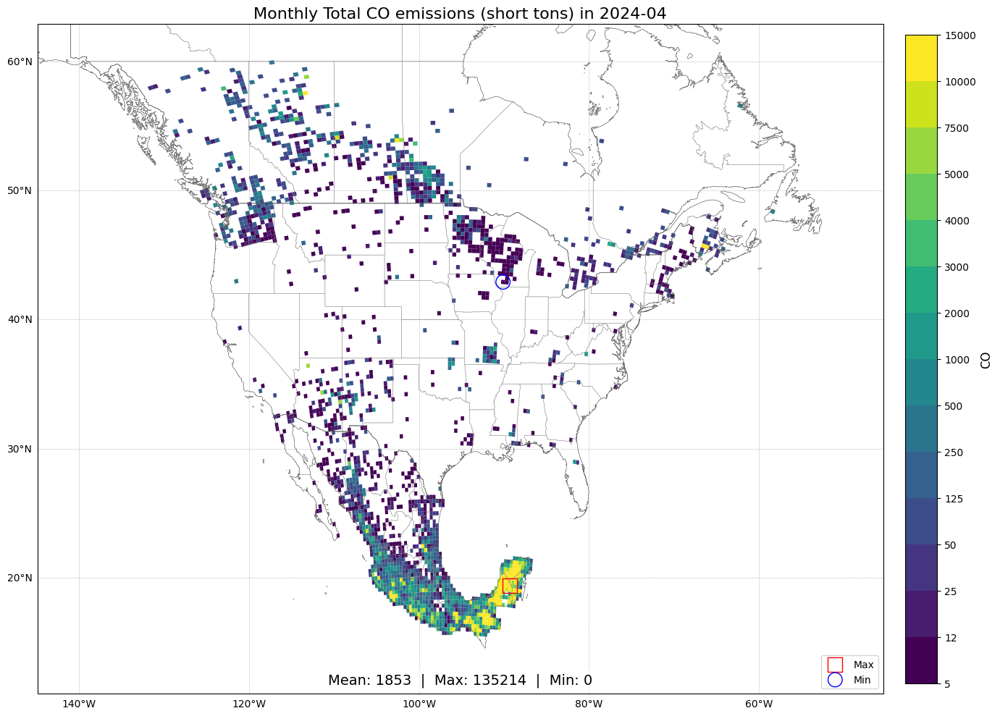

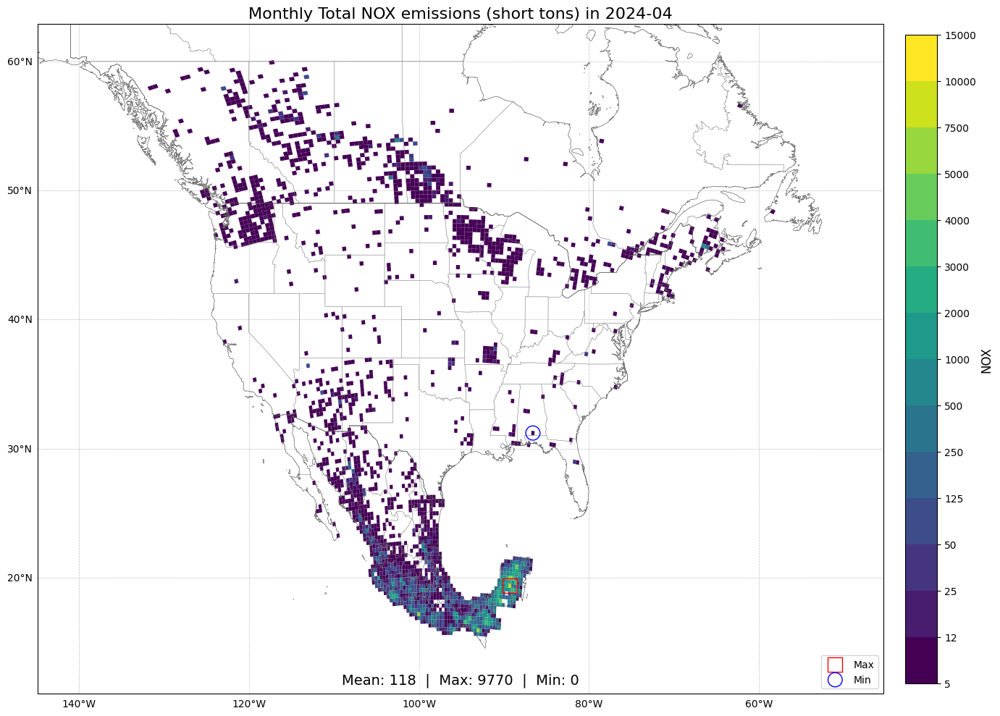

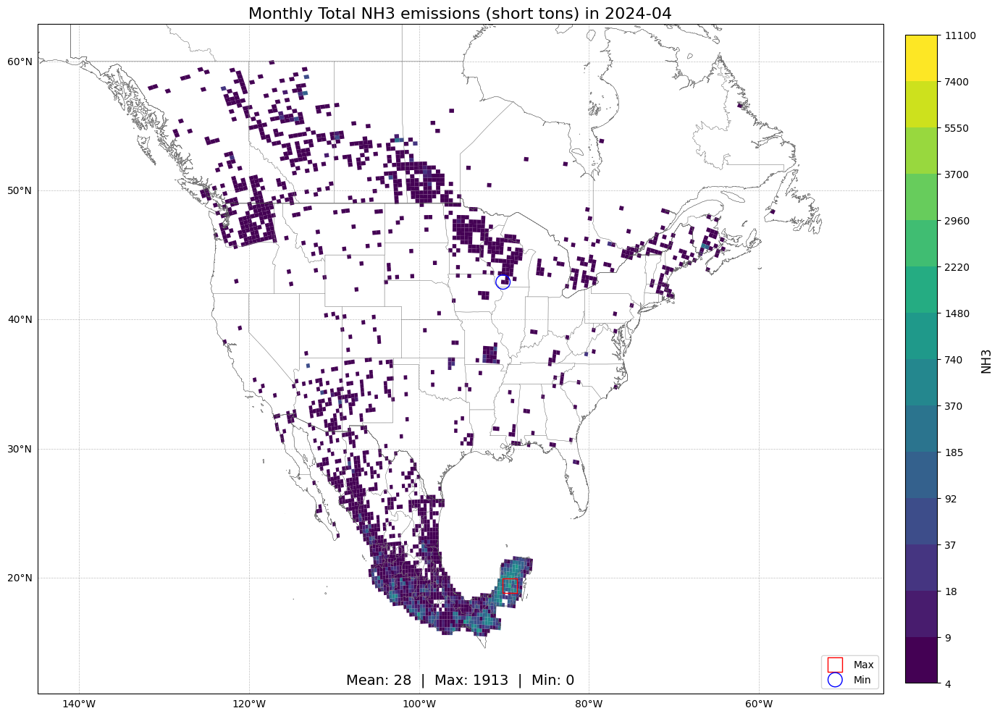

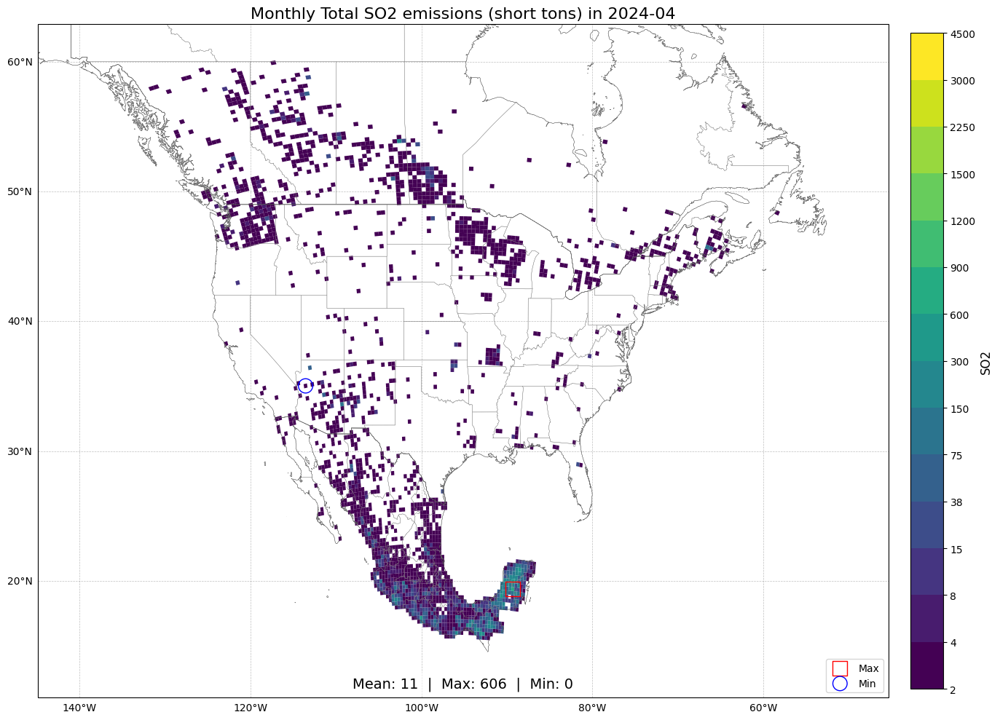

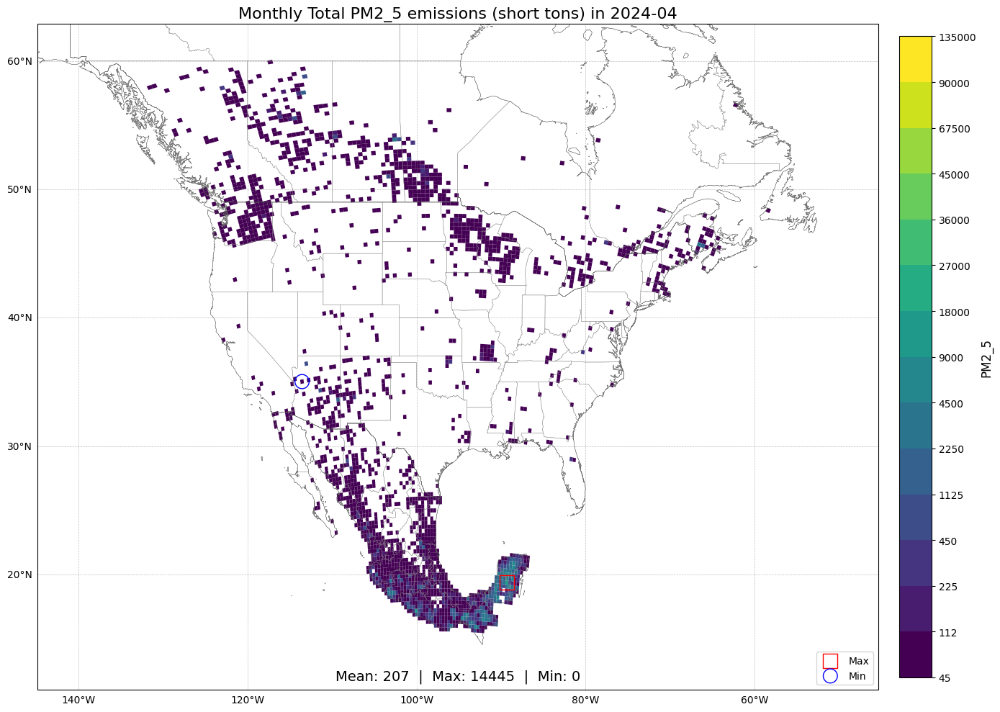

...

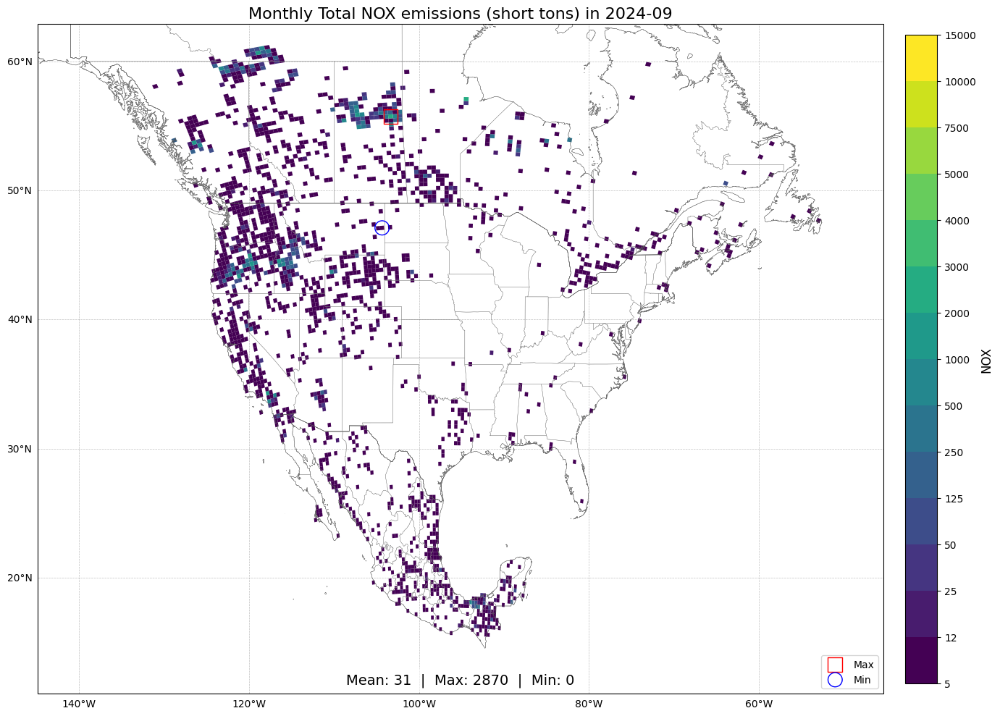

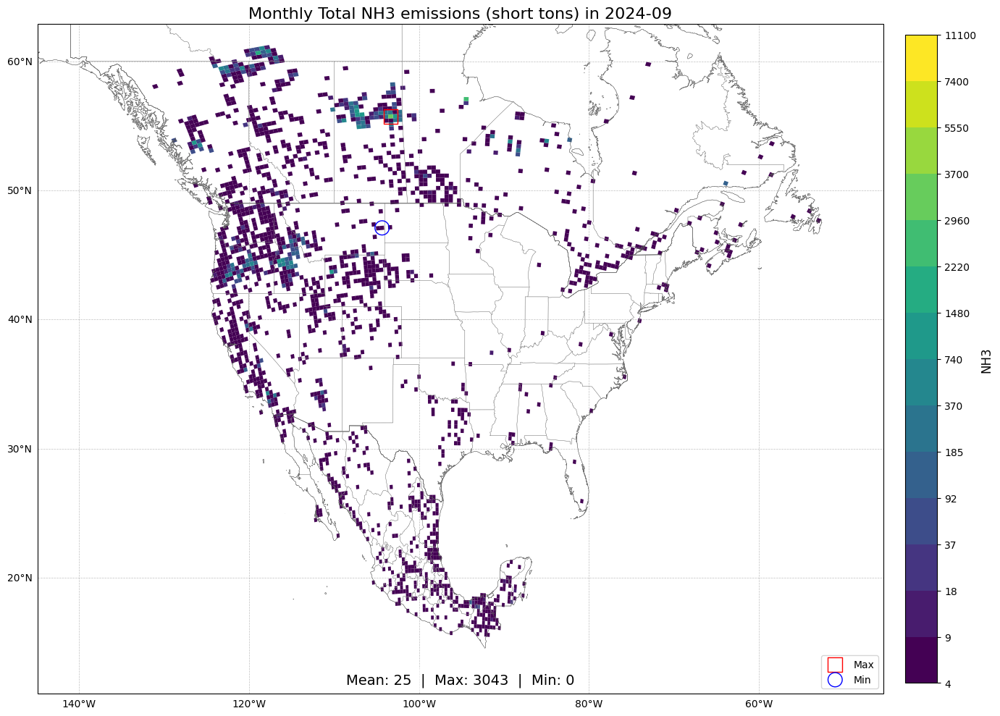

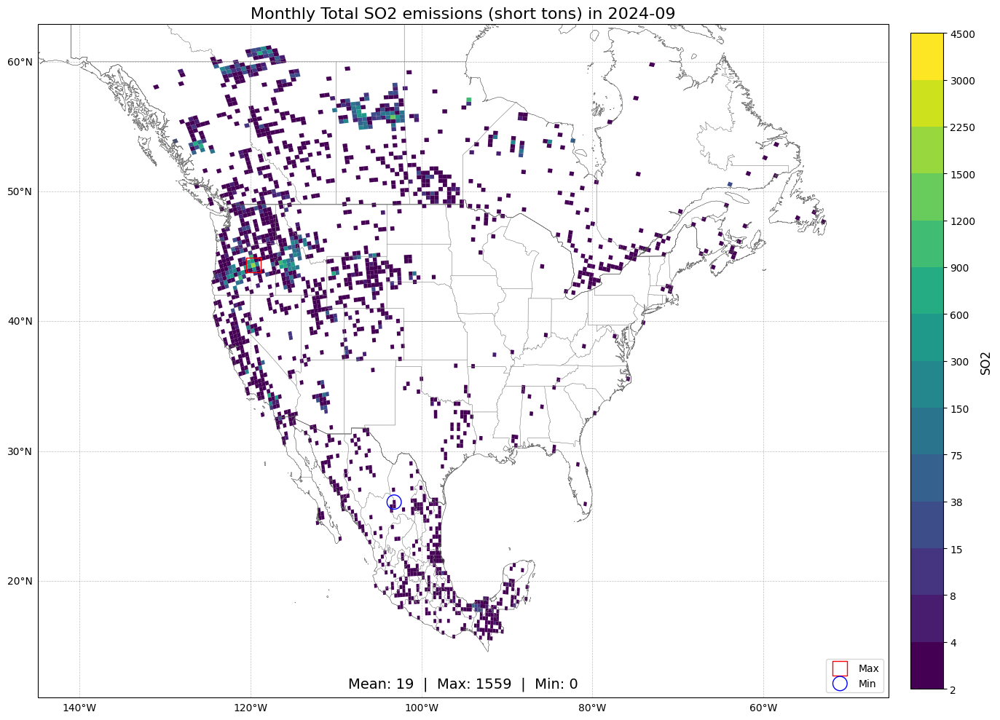

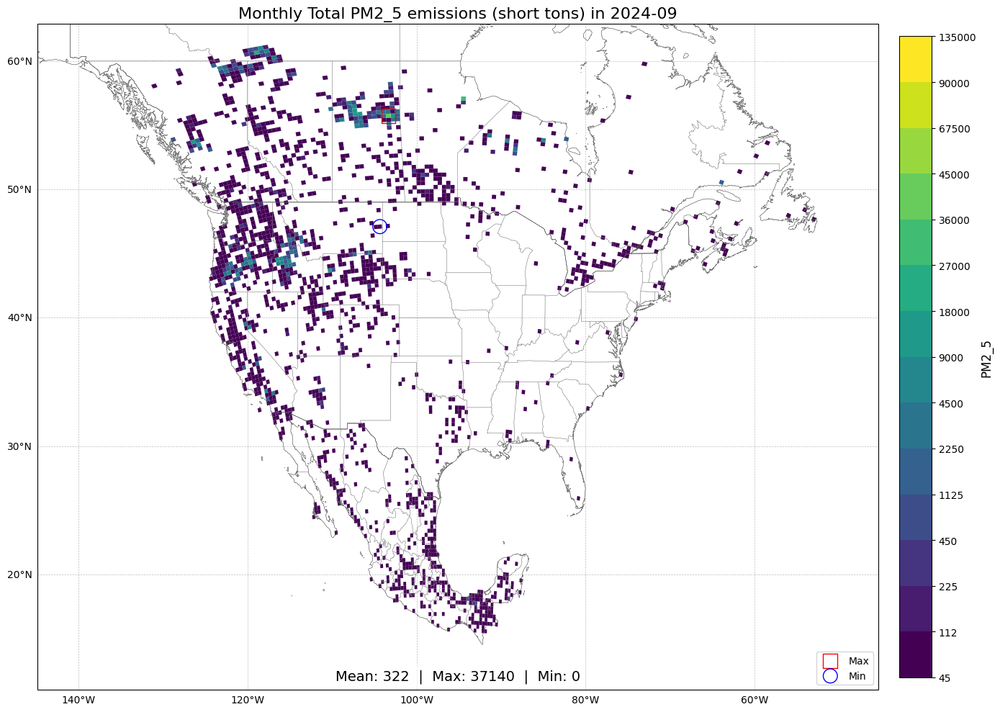

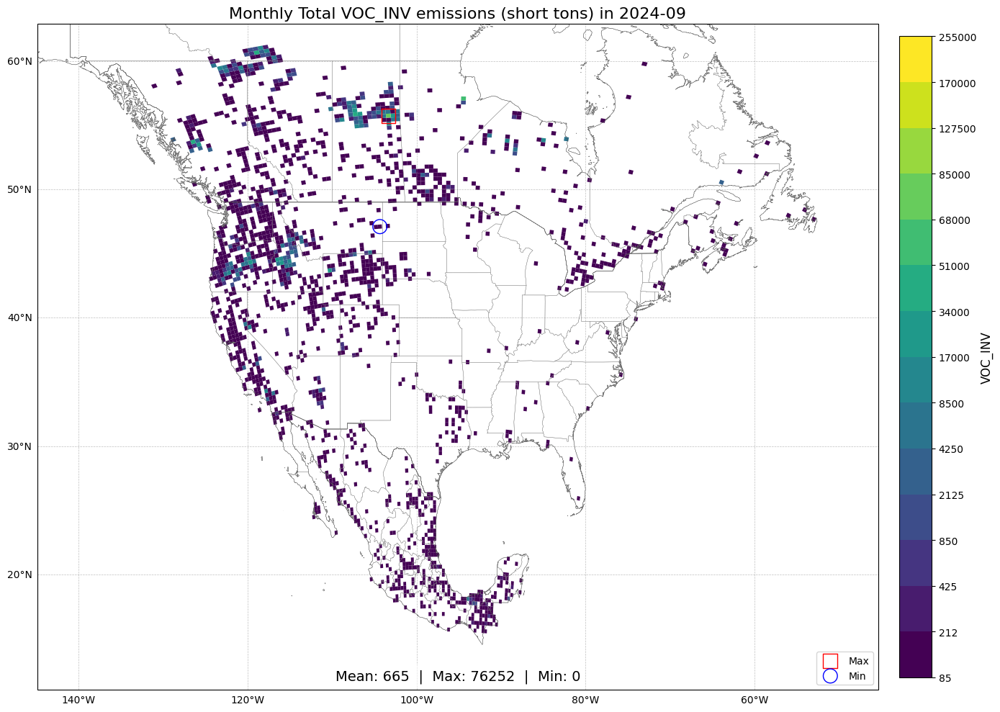

In [10]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import numpy as np

#prior maxpval for ptfire-rx {'ACRESBURNED': 72573.90008, 'NOX': 541.2936148, 'PM2_5': 2095.0163998}
#prior maxpval for 3 fire-sectors {'ACRESBURNED': 525970.08296, 'NOX': 13179.6422586, 'PM2_5': 129037.75946799999}
pollst = {
    #'ACRESBURNED':20000.0,
    'CO': 5000.,
    'NOX': 5000,
    'NH3': 3700.0,
    'SO2': 1500.0,
    'PM2_5': 45000.,
    #'PM10': 500.,
    'VOC_INV': 85000.0,
}


monlst = ['2024-04', '2024-05', '2024-06', '2024-07', '2024-08', '2024-09']#, '2024-10']

icase = "wldfire"

mxbound = None

for imon in monlst:
    
    montt = None
    
    for isec in seclst[icase]:
        # 
        if isec == 'ptfire-mx':
            monthly_grid_totals[isec]['VOC_INV'] = monthly_grid_totals[isec]['TOG'] * (1 - 0.13) # Use 0.13 as average of CH4/TOG from profile ID 95861 (for SCC 2810001000) and G8746 (for SCC 2801500000)
            pol2sum = ['ACRESBURNED', 'CO', 'NH3', 'NOX' ,'PM10', 'PM2_5', 'PMC', 'SO2', 'VOC_INV']
        else:
            pol2sum = [ 'ACRESBURNED',   'CO', 'NOX', 'NH3', 'PM2_5', 'SO2', 'PM10', 'VOC_INV', 'VOC',
              'NONHAPVOC', 'BENZENE', 'TOLUENE', 'XYLENES', 'STYRENE', 'BUTADIE', 'FORMALD' ]
    
        #print(monthly_grid_totals[isec][monthly_grid_totals[isec]['YearMonth']==imon])
        sec_monthly            = monthly_grid_totals[isec][monthly_grid_totals[isec]['YearMonth']==imon].copy()
        #print(sec_monthly['ACRESBURNED'].sum)
        sec_monthly            = sec_monthly.groupby(['X cell','Y cell'])[list(pollst.keys())].sum(numeric_only=True).reset_index()
        sec_monthly['X cell'] = sec_monthly['X cell'].astype(int)
        sec_monthly['Y cell'] = sec_monthly['Y cell'].astype(int)
        
        if montt is None:
            montt = sec_monthly
        else:
            montt = pd.concat([montt,sec_monthly])
        
    #print(montt)
    montt = montt.groupby(['X cell','Y cell'])[list(pollst.keys())].sum(numeric_only=True).reset_index()
    #print(f"Total ACRESBURNED in {imon}: {montt['ACRESBURNED'].sum()}")
    
    if yrtt[icase] is None:
        yrtt[icase] = montt.copy()
    else:
        yrtt[icase] = pd.concat([yrtt[icase], montt])
    
    montt = DOMAIN.merge(montt,on=['X cell','Y cell'],how='left')
    #print(montt)
    
    #if mxbound is None:
    #    mxbound = montt
    #else:
    #    mxbound = get_vbound(mxbound, montt)
        
    for ipol,scaleF in pollst.items():
                
        v_bounds = [i * scaleF for i in conc_bars[ipol]]
        maxval[icase][ipol] = max(maxval[icase][ipol],montt[ipol].max())
        
        if ipol == 'ACRESBURNED':
            unit = 'acres'
        else:
            unit = 'short tons'
        
        #print(f"Total {ipol} in {imon}: {montt[ipol].sum()}")
        
        plot_gdf(gdf = montt,
            pltvar = ipol,
            v_label = f'{ipol}',
            v_bounds = v_bounds,
            pltTile = f"Monthly Total {ipol} emissions ({unit}) in {imon}",
            gdf_bound = DOMAIN,
            vmask = None,
            plotF=f'{OUTDIR}/map_{icase}_MonthlyTotal_{ipol}_{imon}.png',
            clormap='viridis',
            tick_format=".0f")
    

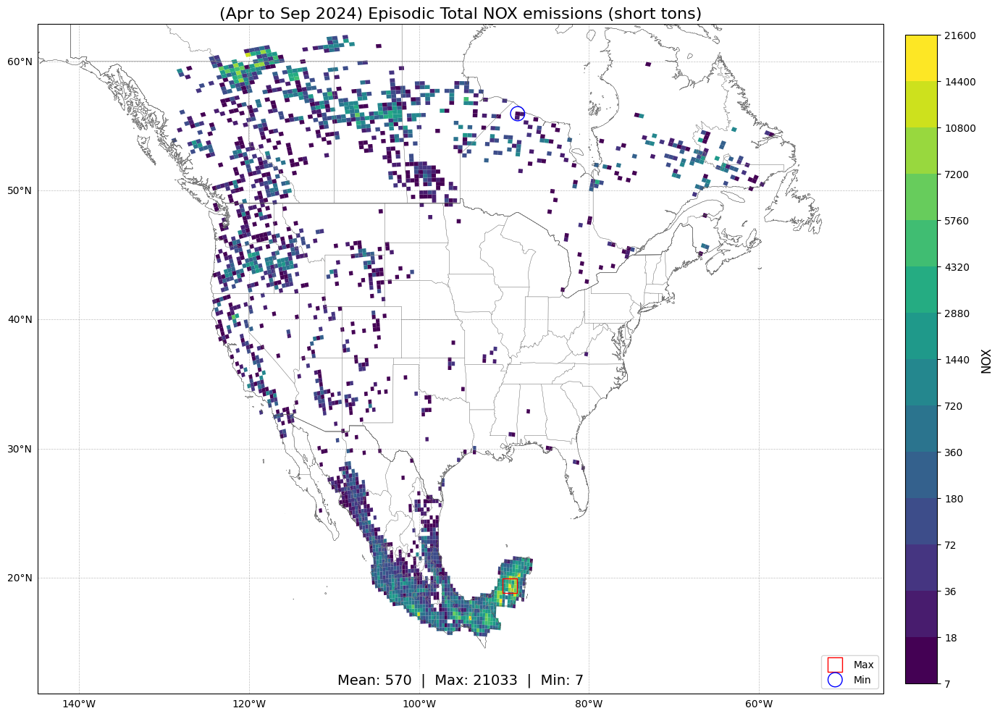

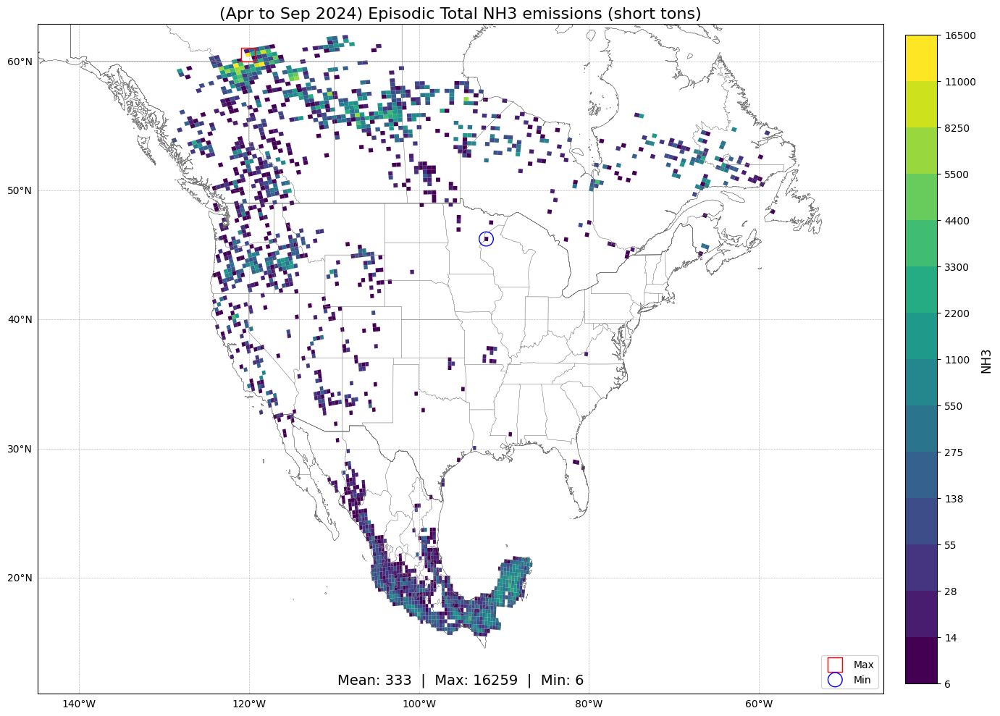

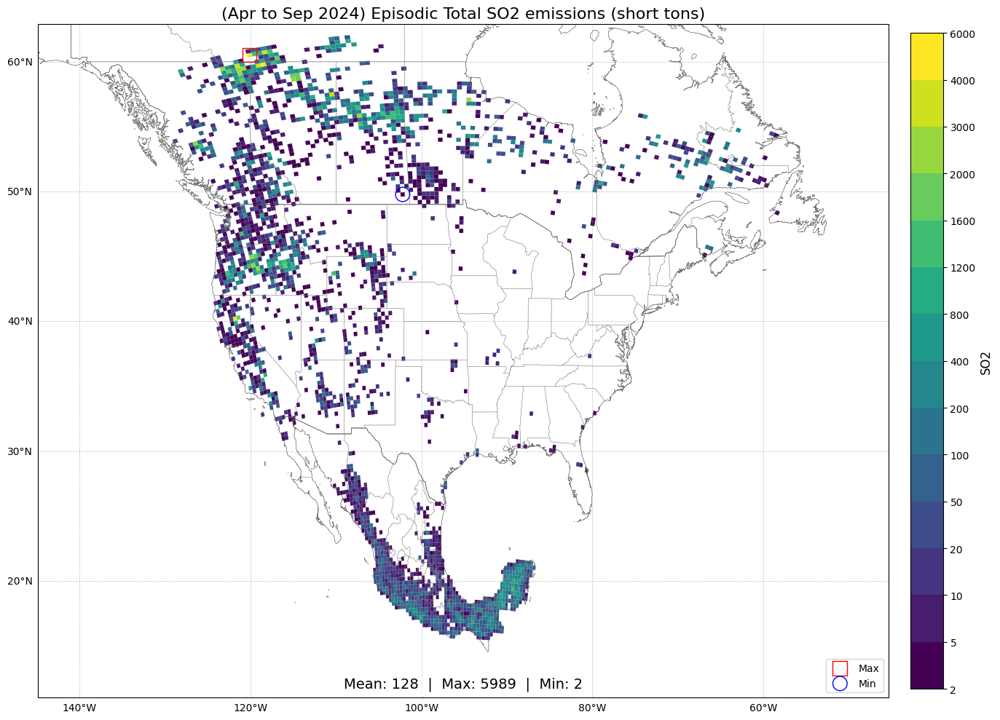

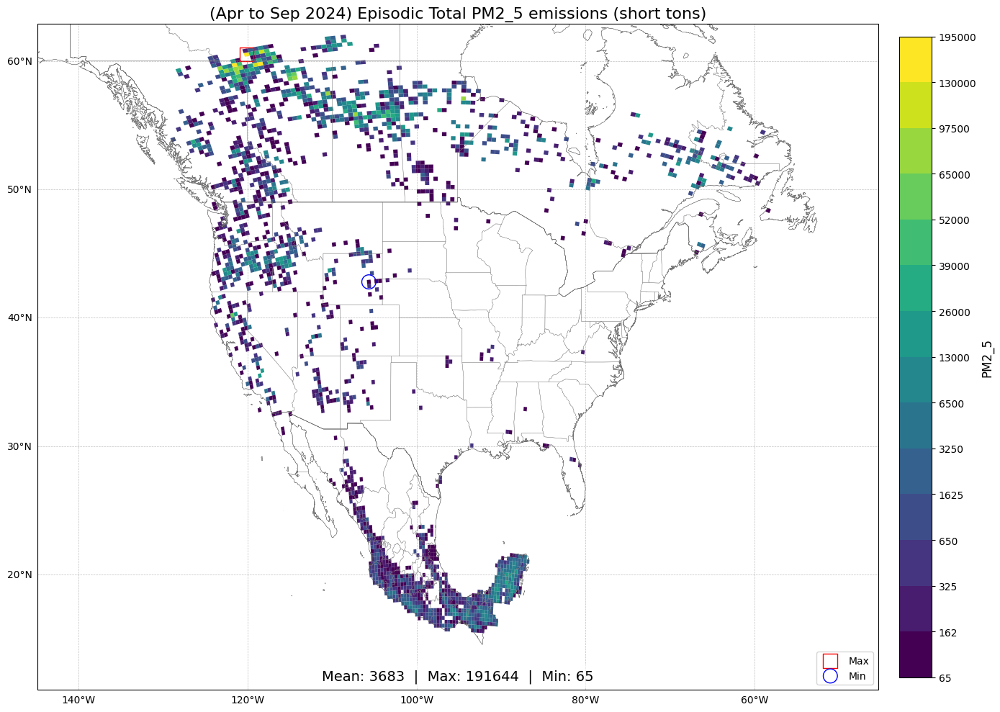

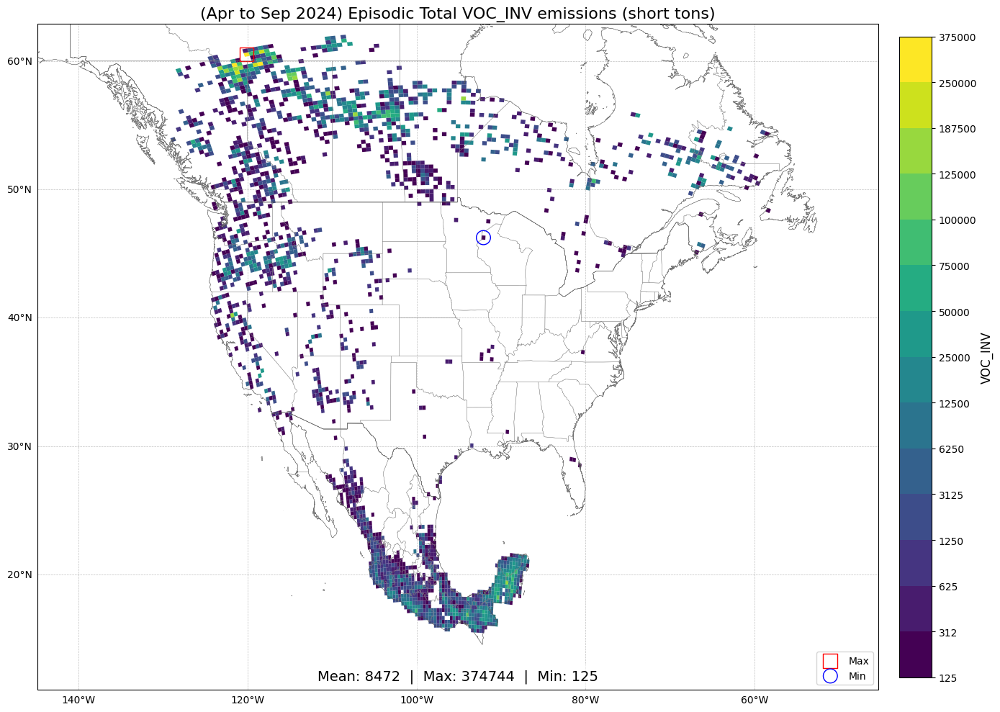

{'wldfire': {'ACRESBURNED': -9999, 'CO': -9999, 'NOX': 21033.243734990003, 'NH3': 16259.26031484, 'SO2': 5988.525476549999, 'PM2_5': 191644.105453, 'PM10': -9999, 'VOC_INV': 374743.748339}, 'rxfire': {'ACRESBURNED': -9999, 'CO': -9999, 'NOX': 869.2903959, 'NH3': 158.21522066, 'SO2': 676.2608824, 'PM2_5': 3230.038486, 'PM10': -9999, 'VOC_INV': 5050.503476}, 'allfires': {'ACRESBURNED': -9999, 'CO': -9999, 'NOX': -9999, 'NH3': -9999, 'SO2': -9999, 'PM2_5': -9999, 'PM10': -9999, 'VOC_INV': -9999}}


In [11]:
### Plot episode total
#'allfires': {'NOX': 21033.243734990003, 'SO2': 5988.525476549999, 'PM2_5': 191644.105453, 'VOC_INV': 374743.748339}}
pollst = {
    #'ACRESBURNED':20000.0,
    #'CO': 5000.,
    'NOX': 7200,
    'NH3': 5500.0,
    'SO2': 2000.0,
    'PM2_5': 65000.,
    #'PM10': 500.,
    'VOC_INV': 125000.0,
}

#icase = "rxfire"


yrtt[icase] = yrtt[icase].groupby(['X cell','Y cell'])[list(pollst.keys())].sum(numeric_only=True).reset_index()
yrtt[icase] = DOMAIN.merge(yrtt[icase],on=['X cell','Y cell'],how='left')
#print(yrtt)

for ipol,scaleF in pollst.items():
                
    v_bounds = [i * scaleF for i in conc_bars[ipol]]
    maxyrval[icase][ipol] = yrtt[icase][ipol].max()
    
    if ipol == 'ACRESBURNED':
        unit = 'acres'
    else:
        unit = 'short tons'

    plot_gdf(gdf = yrtt[icase],
            pltvar = ipol,
            v_label = f'{ipol}',
            v_bounds = v_bounds,
            pltTile = f"(Apr to Sep 2024) Episodic Total {ipol} emissions ({unit})",
            gdf_bound = DOMAIN,
            vmask = v_bounds[0],
            plotF=f'{OUTDIR}/map_{icase}_EpisodeTotal_{ipol}.png',
            clormap='viridis',
            tick_format=".0f")
print(maxyrval)

### Read Report from EMP 2022 ###

In [ ]:
import pandas as pd

# Read a specific sheet by name
df = pd.read_excel('/proj/ie/proj/SMOKE/htran/Emission_Modeling_Platform/2022v1/2022hc_cb6_22m/reports/2022v1_2016v3_state_scc_sector_report_13jan2025.xlsx', sheet_name='platform state-scc-sector')
#print(df)

# Strip extra spaces from column names
df.columns = df.columns.str.strip()
df=df[(df['Sector'].isin(['ptfire-wild','ptfire-rx']))].copy()
df=df[~(df['State'].isin(['Alaska','Hawaii']))].copy()

# Pivot the table
df_pivoted = df.pivot_table(
    index=['State', 'SCC'],   # group by these
    columns='Pollutant',                # make each pollutant a column
    values='2022hc',                    # use 2022hc values
    aggfunc='first'                     # in case of duplicates
).reset_index()

# Optional: remove column name from pivoted axis
df_pivoted.columns.name = None

# Done
print(df_pivoted.head())

# Group by YearMonth and sum numeric columns
pol2sum = [ 'CO' ,'NH3', 'NOX', 'PM10-PRI', 'PM25-PRI', 'SO2', 'VOC' ]
    
df_pivoted = df_pivoted.groupby(['SCC'])[pol2sum].sum(numeric_only=True).reset_index()
print(df_pivoted)

In [ ]:
df_pivoted.to_csv(f"/proj/ie/proj/GSA-EMBER/BlueSky/ember_2024/smoke/scripts/run_report/outputs/2022v1_2016v3_state_scc_sector_report_13jan2025.csv",index=False)

## Get Acresburned from ptday ##

In [ ]:
ptdays = {
    'ptfire-wild-us':'/proj/ie/proj/GSA-EMBER/BlueSky/ember_2024/smoke/inputs/ptday_sf2_2024_ember_us_wf_ff10.csv',
    'ptfire-rx-us':'/proj/ie/proj/GSA-EMBER/BlueSky/ember_2024/smoke/inputs/ptday_sf2_2024_ember_us_rx_ff10.csv',
    'ptfire-canada':'/proj/ie/proj/GSA-EMBER/BlueSky/ember_2024/smoke/inputs/ptday_sf2_2024_ember_canada_wf_ff10.csv',
    'ptfire-mx':'/proj/ie/proj/GSA-EMBER/BlueSky/FINN/finn2ff10/invens/ptday_finn25_MX_finn25_2024_ff10.csv'
}

col_kept = ['country_cd', 'region_cd', 'tribal_code', 'facility_id', 'unit_id',
       'rel_point_id', 'process_id', 'scc', 'poll','monthnum', 'monthtot']

pol4sum = ['ACRESBURNED','CO', 'NOX','NH3','PM2_5','SO2', 'PM10','VOC']

for isec in ['ptfire-wild-us']:
    ptinv = pd.read_csv(ptdays[isec],dtype=object,comment='#')
    ptinv = ptinv[col_kept].copy()
    #ptinv = ptinv[ptinv['poll']=='ACRESBURNED'].copy().reset_index()
    ptinv['monthtot'] = ptinv['monthtot'].astype(float)
    
    print("Initial read:")
    print(ptinv.head())

    print("\nUnique values in 'poll':", ptinv['poll'].unique())
    print("Non-null monthtot count:", ptinv['monthtot'].notna().sum())
    
    ptinv = ptinv.pivot_table(
        index=['country_cd', 'region_cd','monthnum'],
        columns='poll',
        values='monthtot',
        aggfunc='sum'  # Use sum or mean depending on your data
    ).reset_index()
    
    ptinv = ptinv.merge(counties,on=['country_cd','region_cd'],how='left')

    print(ptinv_pivot.head())
    print(ptinv_pivot.columns)
    
    ptinv = ptinv.groupby(['monthnum','State Abbrev','Country Code','State Code'])[pol4sum].sum().reset_index()
    print(ptinv)

    ptinv.to_csv(f"/proj/ie/proj/GSA-EMBER/BlueSky/ember_2024/smoke/scripts/run_report/outputs/monthly_state_acresburned_from_ptday_{isec}.csv", index=False)

In [ ]:
import pandas as pd
import numpy as np

ptdays = {
    'ptfire-wild-us': '/proj/ie/proj/GSA-EMBER/BlueSky/ember_2024/smoke/inputs/ptday_sf2_2024_ember_us_wf_ff10.csv',
    'ptfire-rx-us': '/proj/ie/proj/GSA-EMBER/BlueSky/ember_2024/smoke/inputs/ptday_sf2_2024_ember_us_rx_ff10.csv',
    'ptfire-canada': '/proj/ie/proj/GSA-EMBER/BlueSky/ember_2024/smoke/inputs/ptday_sf2_2024_ember_canada_wf_ff10.csv',
    'ptfire-mx': '/proj/ie/proj/GSA-EMBER/BlueSky/FINN/finn2ff10/invens/ptday_finn25_MX_finn25_2024_ff10.csv'
}

col_kept = ['country_cd', 'region_cd', 'tribal_code', 'facility_id', 'unit_id',
            'rel_point_id', 'process_id', 'scc', 'poll', 'monthnum', 'monthtot']

for isec in ['ptfire-wild-us']:
    ptinv = pd.read_csv(ptdays[isec], dtype=object, comment='#')
    ptinv = ptinv[col_kept].copy()

    # Clean 'monthtot' column
    ptinv['monthtot'] = (
        ptinv['monthtot']
        .astype(str)
        .str.strip()
        .str.replace(',', '', regex=False)
        .replace('', np.nan)
    )
    ptinv['monthtot'] = pd.to_numeric(ptinv['monthtot'], errors='coerce')

    print("Initial read:")
    print(ptinv.head())
    print("\nUnique values in 'poll':", ptinv['poll'].unique())
    print("Non-null monthtot count:", ptinv['monthtot'].notna().sum())
    ptinv['monthtot'] = pd.to_numeric(ptinv['monthtot'], errors='coerce')

    ptinv_pivot = ptinv.pivot_table(
        index=['country_cd', 'region_cd', 'tribal_code', 'facility_id', 'unit_id',
               'scc', 'monthnum'],
        columns='poll',
        values='monthtot',
        aggfunc='sum'
    ).reset_index()

    print("\nPivoted DataFrame:")
    print(ptinv_pivot.head())
    print("Pivoted columns:", ptinv_pivot.columns.tolist())

### Backup Code ###

In [ ]:
sys.exit(0)

In [ ]:
def plot_gdf(gdf, pltvar, v_label, v_bounds, pltTile=None, gdf_bound=None, vmask=None, plotF=None, clormap='viridis', tick_format=".2f",overlay_gdf=None):    
    
    # Simplified U.S. states
    #states = gpd.read_file("https://www2.census.gov/geo/tiger/GENZ2022/shp/cb_2022_us_state_5m.zip")
    #counties = gpd.read_file("https://www2.census.gov/geo/tiger/GENZ2022/shp/cb_2022_us_county_5m.zip")
    states = gpd.read_file("/proj/ie/proj/GSA-EMBER/BlueSky/ember_2024/shapefiles/ne_10m_admin_1_states_provinces.zip")
    countries = gpd.read_file("/proj/ie/proj/GSA-EMBER/BlueSky/ember_2024/shapefiles/ne_10m_admin_0_countries.zip")

    # Match CRS
    states = states.to_crs(gdf.crs)
    countries = countries.to_crs(gdf.crs)
    
    v_bins = len(v_bounds) - 1
    v_cmap = plt.get_cmap(clormap, v_bins)
    v_norm = mcolors.BoundaryNorm(boundaries=v_bounds, ncolors=v_bins)
    
    
    fig, ax = plt.subplots(figsize=(12, 10))  # increase size
   
    if gdf_bound is not None and not gdf_bound.empty:
        gdf_clip = gpd.clip(gdf, gdf_bound).copy()
    else:
        gdf_clip = gdf.copy()
        
    if vmask:
        gdf_clip[pltvar] = gdf_clip[pltvar].mask(gdf_clip[pltvar] < vmask)
    
    # Calculate stats from the masked data
    v_valid = gdf_clip[pltvar].dropna()
    v_mean  = v_valid.mean()
    v_max   = v_valid.max()
    v_min   = v_valid.min()
    
    # Plot using the discrete colormap
    gdf_clip.plot(
        column=pltvar,
        cmap=v_cmap,
        norm=v_norm,
        edgecolor='none',
        linewidth=0.01,
        ax=ax,
        missing_kwds={"color": "none", "label": "No data"}
    )
    
    # Overlay NO2_gdf using the same color scale
    if overlay_gdf is not None and not overlay_gdf.empty:
        overlay_gdf = overlay_gdf.to_crs(gdf.crs)  # Match CRS
        
        print(gdf_clip.total_bounds)
        print(overlay_gdf.total_bounds)

        # Only keep rows with the plotting variable
        if pltvar in overlay_gdf.columns:
            overlay_gdf.plot(
                ax=ax,
                column='no2(ppb)',
                cmap=v_cmap,
                norm=v_norm,
                markersize=40,
                legend=False,
                alpha=0.8,
                edgecolor='white',
                linewidth=0.3
            )

    # Foreground layers
    countries.plot(ax=ax, facecolor='none', edgecolor='grey', linewidth=0.25)
    states.plot(ax=ax, facecolor='none', edgecolor='grey', linewidth=0.15)
    
    # Zoom to data
    ax.set_xlim(valid_bound.total_bounds[0], valid_bound.total_bounds[2])
    ax.set_ylim(valid_bound.total_bounds[1], valid_bound.total_bounds[3])
    
    # Add custom discrete colorbar
    sm = cm.ScalarMappable(cmap=v_cmap, norm=v_norm)
    sm._A = []  # required for colorbar
    
    # Midpoints of each bin
    tick_locs = [(v_bounds[i] + v_bounds[i+1]) / 2 for i in range(v_bins)]
    #tick_labels = [f'{v_bounds[i]:.2f}–{v_bounds[i+1]:.2f}' for i in range(v_bins)]
    tick_labels = [
        f'{format(v_bounds[i], tick_format)}–{format(v_bounds[i+1], tick_format)}'
        for i in range(v_bins)
    ]

    cbar = fig.colorbar(sm, ax=ax, fraction=0.03, pad=0.02, ticks=tick_locs)
    cbar.set_label(v_label, fontsize=12)
    cbar.ax.set_yticklabels(tick_labels)

    ax.set_title(pltTile, fontsize=16)
    
    # Format the text
    stats_text = f"Mean: {v_mean:.3f}  |  Max: {v_max:.3f}  |  Min: {v_min:.3f}"
    # Add text below the map
    ax.text(
        0.5, -0.02,  # x, y in axis coordinates (relative to plot)
        stats_text,
        fontsize=12,
        ha='center',
        va='top',
        transform=ax.transAxes
    )
    
    ax.axis('off')
    
    plt.tight_layout()
    if plotF:
        plt.savefig(plotF, dpi=300)
    plt.show()